## Section 1 - Data manipulation



Firstly, we will upload the required libraries for this task.

In [589]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import xgboost
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, plot_confusion_matrix, plot_precision_recall_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from chart_studio import plotly
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
import plotly.figure_factory as ff
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

In [590]:
data_full = pd.read_csv('/Users/m.nicajus/Downloads/bank/bank-full.csv', sep = ';') #will be used as train data 
data_test = pd.read_csv('/Users/m.nicajus/Downloads/bank/bank.csv', sep = ';') #will be used as test data 

In [591]:
#This is full data of bank
data_full

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [592]:
data_test

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,33,services,married,secondary,no,-333,yes,no,cellular,30,jul,329,5,-1,0,unknown,no
4517,57,self-employed,married,tertiary,yes,-3313,yes,yes,unknown,9,may,153,1,-1,0,unknown,no
4518,57,technician,married,secondary,no,295,no,no,cellular,19,aug,151,11,-1,0,unknown,no
4519,28,blue-collar,married,secondary,no,1137,no,no,cellular,6,feb,129,4,211,3,other,no


By checking the types of the data for each column we get the following.

In [593]:
data_full['age'].value_counts()
print(data_full.dtypes)

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object


We are checking in this data set whether there are NaN values for each columns

In [594]:
data_full.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [595]:
data_test.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

From the above we can say that there are no non-available values in this data set. By the following line of code we can check if there is a duplications in the row of this data set.

In [596]:
print(data_full.duplicated().value_counts())
print(data_test.duplicated().value_counts())

False    45211
dtype: int64
False    4521
dtype: int64


From the output above we can conclude that there ar no duplicated values in given data sets. There were no rows that were needed to be removed. We can identify each row of this data set unique. 

Furthermore, variables in this data set need to be checked to assess the frequency of each entry of the column. Consider the following:

In [597]:
for col in data_full.columns.values:
    print(f"\033[1m{col} \n{20 * '-'}\033[0m")
    print(data_full[col].value_counts(), '\n')

age 
--------------------
32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
90       2
92       2
93       2
95       2
94       1
Name: age, Length: 77, dtype: int64 

job 
--------------------
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 

marital 
--------------------
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64 

education 
--------------------
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 

default 
--------------------
no     44396
yes      815
Name: default, dtype: int64 

balance 
--------------------
0        3514
1         195
2         156
4         139
3         134
         ... 
4305        1
6352        1
18881       1
148

In [598]:
#Same we can do for the test bank data
for col in data_test.columns.values:
    print(f"\033[1m{col} \n{20 * '-'}\033[0m")
    print(data_full[col].value_counts(), '\n')

age 
--------------------
32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
90       2
92       2
93       2
95       2
94       1
Name: age, Length: 77, dtype: int64 

job 
--------------------
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 

marital 
--------------------
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64 

education 
--------------------
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 

default 
--------------------
no     44396
yes      815
Name: default, dtype: int64 

balance 
--------------------
0        3514
1         195
2         156
4         139
3         134
         ... 
4305        1
6352        1
18881       1
148

Note that we have potential 16 features that need to be assessed. We will use summary statistics to describe numerical and categorical columns of data_full set.

In [599]:
data_full.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [600]:
data_full.describe(include = ['O']) #this is summary statistics for categorical features

,job,marital,education,default,housing,loan,contact,month,poutcome,y
count,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36959,39922


Note that we have four categorical variables as follows: default, housing, loan, y. These features can be converted into boolean variables in order to make further computations meaning that it return 0 if value in column_name is 'no', returns 1 if value in column_name is 'yes'. 

In [601]:
def bool_yn(row, column_name):
    return 1 if row[column_name] == 'yes' else 0

def clean_data(data_full):
    
    cleaned_data_f = data_full.copy()
    
    
    bool_columns = ['default', 'housing', 'loan', 'y']
    for bool_col in bool_columns:
        cleaned_data_f[bool_col] = data_full.apply(lambda row: bool_yn(row, bool_col),axis=1)
        
    return cleaned_data_f
  

In [602]:
data_full_cleaned = clean_data(data_full)
data_full_cleaned

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,0,2143,1,0,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,0,29,1,0,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,0,2,1,1,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,0,1506,1,0,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,0,1,0,0,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,825,0,0,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,0,1729,0,0,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,0,5715,0,0,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,0,668,0,0,telephone,17,nov,508,4,-1,0,unknown,0


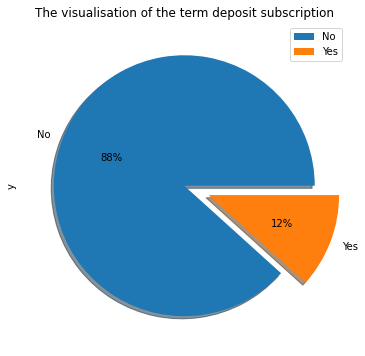

In [603]:
#Let's make a visualize about our target column ('y' column)
plt.figure(figsize=(12,6))
labels = ['No','Yes']
data_full['y'].value_counts().plot.pie(shadow=True,
                                labels=labels,
                                autopct='%0.f%%',
                                explode = [0.0,0.2])
plt.title('The visualisation of the term deposit subscription')
plt.legend()

Note that new variables can be created in order to have a better understanding of given data. We will use numerical columns to inspect the effect of the term deposit subscription. We are doing this to verify there is a need to remove some variables for further analysis. Let us define the number of contacts performed during this campaign and term deposit.Consider the following:

In [604]:
campaign_y_df = pd.DataFrame() # empty data frame
campaign_y_df['campaign_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','campaign']].describe())['campaign']
campaign_y_df['campaign_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','campaign']].describe())['campaign']

campaign_y_df

,campaign_yes,campaign_no
count,5289.000000,39922.000000
mean,2.141047,2.846350
std,1.921826,3.212767
min,1.000000,1.000000
25%,1.000000,1.000000
50%,2.000000,2.000000
75%,3.000000,3.000000
max,32.000000,63.000000


Same we can do with same with column 'age' to see the corrrespondend values of the summary statistics as follows:

In [605]:
age_y_df = pd.DataFrame() # empty data frame
age_y_df['age_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','age']].describe())['age']
age_y_df['age_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','age']].describe())['age']

age_y_df

,age_yes,age_no
count,5289.000000,39922.000000
mean,41.670070,40.838986
std,13.497781,10.172662
min,18.000000,18.000000
25%,31.000000,33.000000
50%,38.000000,39.000000
75%,50.000000,48.000000
max,95.000000,95.000000


Furthermore, for the 'balance' column we have the following:

In [606]:
balance_y_df = pd.DataFrame() # empty data frame
balance_y_df['balance_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','balance']].describe())['balance']
balance_y_df['balance_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','balance']].describe())['balance']

balance_y_df

,balance_yes,balance_no
count,5289.000000,39922.000000
mean,1804.267915,1303.714969
std,3501.104777,2974.195473
min,-3058.000000,-8019.000000
25%,210.000000,58.000000
50%,733.000000,417.000000
75%,2159.000000,1345.000000
max,81204.000000,102127.000000


And with the column 'duration' we have the following

In [607]:
duration_y_df = pd.DataFrame() # empty data frame
duration_y_df['duration_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','duration']].describe())['duration']
duration_y_df['duration_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','duration']].describe())['duration']

duration_y_df

,duration_yes,duration_no
count,5289.000000,39922.000000
mean,537.294574,221.182806
std,392.525262,207.383237
min,8.000000,0.000000
25%,244.000000,95.000000
50%,426.000000,164.000000
75%,725.000000,279.000000
max,3881.000000,4918.000000


For the column 'previous' we have:

In [608]:
previous_y_df = pd.DataFrame() # empty data frame
previous_y_df['previous_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','previous']].describe())['previous']
previous_y_df['previous_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','previous']].describe())['previous']

previous_y_df

,previous_yes,previous_no
count,5289.000000,39922.000000
mean,1.170354,0.502154
std,2.553272,2.256771
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,1.000000,0.000000
max,58.000000,275.000000


In [609]:
pdays_y_df = pd.DataFrame() # empty data frame
pdays_y_df['pdays_yes'] = (data_full_cleaned[data_full_cleaned['y'] == 1][['y','pdays']].describe())['pdays']
pdays_y_df['pdays_no'] = (data_full_cleaned[data_full_cleaned['y'] == 0][['y','pdays']].describe())['pdays']

pdays_y_df

,pdays_yes,pdays_no
count,5289.000000,39922.000000
mean,68.702968,36.421372
std,118.822266,96.757135
min,-1.000000,-1.000000
25%,-1.000000,-1.000000
50%,-1.000000,-1.000000
75%,98.000000,-1.000000
max,854.000000,871.000000


***
From the above calculations we can conclude the following statements:

* The number of contacts with term deposit subcription was less than those with not having term deposit subscription. This means that people with term deposit product were less contacted than those with no product( bank term deposit) and they are more willing to include the deposit of money into an account at a financial institution. 

* Older people tend to be subscribed for bank term deposit.

* People who are subscribed to a term deposit are tend to have greater balances than those who are not. That is obvious, because they need to have higher or sufficient funds in order to be subscripted to use given financial product.

* Duration of the people of contact time is longer for those who are subscribed to term deposit than those who are not subscribed to this financial product. This is due to potential updates of the current product or explanations of the product(answering questions) to the subscribers of the term deposit.

* The average number of contacts performed before the current campaign were higher for those people who are not having a term deposit subscription.

By checking the summary statistics of the feature variable 'pdays', we are dropping this column and consider the following data

In [610]:
data_full_cleaned= data_full_cleaned.drop(columns = ['pdays'])

In [612]:
data_full_cleaned

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,previous,poutcome,y
0,58,management,married,tertiary,0,2143,1,0,unknown,5,may,261,1,0,unknown,0
1,44,technician,single,secondary,0,29,1,0,unknown,5,may,151,1,0,unknown,0
2,33,entrepreneur,married,secondary,0,2,1,1,unknown,5,may,76,1,0,unknown,0
3,47,blue-collar,married,unknown,0,1506,1,0,unknown,5,may,92,1,0,unknown,0
4,33,unknown,single,unknown,0,1,0,0,unknown,5,may,198,1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,825,0,0,cellular,17,nov,977,3,0,unknown,1
45207,71,retired,divorced,primary,0,1729,0,0,cellular,17,nov,456,2,0,unknown,1
45208,72,retired,married,secondary,0,5715,0,0,cellular,17,nov,1127,5,3,success,1
45209,57,blue-collar,married,secondary,0,668,0,0,telephone,17,nov,508,4,0,unknown,0


Furthermore, we are going to assess the categorical variables as dummy variables. These will be used in the further analysis.Consider the following:

In [613]:
categorical_col = ['job', 'marital', 'education', 'contact', 'month', 'poutcome']

data_full_cleaned_with_dummies = pd.concat([data_full_cleaned.drop(categorical_col, axis=1),
                                     pd.get_dummies(data_full_cleaned[categorical_col], prefix=categorical_col, prefix_sep='_',
                                     drop_first=True, dummy_na=False)], axis=1)
    
data_full_cleaned_with_dummies

,age,default,balance,housing,loan,day,duration,campaign,previous,y,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,0,0,...,0,0,0,1,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,0,0,...,0,0,0,1,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,0,0,...,0,0,0,1,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,0,0,...,0,0,0,1,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,0,0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,0,1,...,0,0,0,0,1,0,0,0,0,1
45207,71,0,1729,0,0,17,456,2,0,1,...,0,0,0,0,1,0,0,0,0,1
45208,72,0,5715,0,0,17,1127,5,3,1,...,0,0,0,0,1,0,0,0,1,0
45209,57,0,668,0,0,17,508,4,0,0,...,0,0,0,0,1,0,0,0,0,1


## Section 2 - Data visualisation

In this section weare going to viusalise the data set in order to identify potential outliers or to get better insight of the data. Note that data will be modified based on the graphs.

In [614]:
data_full_cleaned['job'].iplot(kind='hist', xTitle='jobs',
                  yTitle='count', title='Distribution of the jobs')

In [615]:
data_full_cleaned['marital'].iplot(kind='hist', xTitle='Marital status',
                  yTitle='count', title='Distribution of the marital status', color = 'green')

In [616]:
data_full_cleaned['education'].iplot(kind='hist', xTitle='Education',
                  yTitle='count', title='Distribution of the types of education', color = 'purple')

In [617]:
data_full_cleaned['contact'].iplot(kind='hist', xTitle='Types of contacting person',
                  yTitle='count', title='Distribution of the ways of contacting clients', color = 'blue')

In [618]:
data_full_cleaned['month'].iplot(kind='hist', xTitle='Months where the person has been contacted',
                  yTitle='count', title='Distribution of the months where the person has been contacted', color = 'pink')

In [619]:
data_full_cleaned['poutcome'].iplot(kind='hist', xTitle='poutcome',
                  yTitle='count', title='Distribution of the poutcome', color = 'navy')

Let's see how term deposit column 'y' value varies depending on various categorical column values. Consider the following function showing the required outcome.

In [620]:
temp_m = pd.DataFrame()
temp_m['No_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 0]['marital'].value_counts()
temp_m['Yes_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 1]['marital'].value_counts()


In [621]:
temp_m.iplot(kind='bar', xTitle='marital status',
                  yTitle='count', title='Distribution of the poutcome')

In [622]:
temp_j = pd.DataFrame()
temp_j['No_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 0]['job'].value_counts()
temp_j['Yes_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 1]['job'].value_counts()

In [623]:
temp_j.iplot(kind='bar', xTitle='Title of job',
                  yTitle='count', title='Distribution of the job based on term deposit subscription participants')

In [624]:
temp_e = pd.DataFrame() # for education column
temp_e['No_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 0]['education'].value_counts()
temp_e['Yes_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 1]['education'].value_counts()

In [625]:
temp_e.iplot(kind='bar', xTitle='Type of education',
                  yTitle='count', title='Distribution of the education based on term deposit subscription participants')

In [626]:
temp_c = pd.DataFrame() # for contact column
temp_c['No_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 0]['contact'].value_counts()
temp_c['Yes_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 1]['contact'].value_counts()


In [627]:
temp_c.iplot(kind='bar', xTitle='Type of contacting clients',
                  yTitle='count', title='Distribution of the ways of contacting clients based on the response of the term deposit subscription ')

In [628]:
temp_mth = pd.DataFrame() # for months column
temp_mth['No_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 0]['month'].value_counts()
temp_mth['Yes_deposit'] = data_full_cleaned[data_full_cleaned['y'] == 1]['month'].value_counts()

In [629]:
temp_mth.iplot(kind='bar', xTitle='Month',
                  yTitle='count', title='Distribution of the months based on the response of the term deposit subscription ')

We are going to take a look which most common job among the yes said clients and what is the percent of this job to all jobs. We will apply this method for the rest  categorical variables

***
# Job feature

In [630]:
data_full_cleaned[['job','y']].groupby(['job'], as_index=True).mean().sort_values(
    by='y',ascending=False).style.background_gradient(axis=None
                                        , low=0.75, high=1.0)

,y
job,
student,0.286780
retired,0.227915
unemployed,0.155027
management,0.137556
admin.,0.122027
self-employed,0.118429
unknown,0.118056
technician,0.110570
services,0.088830


From this we can say that students were the most active in terms of being subscribed to this financial product. The least were blue-collar job position people. However, we are going to count the amount of people who were interested in subscribing term deposit product or not. Consider the following lines of code:

In [631]:
pd.crosstab(data_full_cleaned['job'],data_full_cleaned['y'], margins=True, margins_name='Total').style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,Total
job,,,
admin.,4540,631,5171
blue-collar,9024,708,9732
entrepreneur,1364,123,1487
housemaid,1131,109,1240
management,8157,1301,9458
retired,1748,516,2264
self-employed,1392,187,1579
services,3785,369,4154
student,669,269,938


By inspecting the amounts of each job class participants who are selective between subscribing financial product or not subscribing term deposit we can say that there is a enormous gap between students and blue-collar job class. However, we can make conclusion that 
class are not interested joining the deposit whereas other classes like students, retired are more interested to subscribe.

***
# Marital feature

In [632]:
data_full_cleaned[['marital','y']].groupby(['marital'], as_index=True).mean().sort_values(
    by='y',ascending=False).style.background_gradient(axis=None
                                        , low=0.75, high=1.0)

,y
marital,
single,0.149492
divorced,0.119455
married,0.101235


In [633]:
pd.crosstab(data_full_cleaned['marital'],data_full_cleaned['y'], margins=True, margins_name='Total').style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,Total
marital,,,
divorced,4585,622,5207
married,24459,2755,27214
single,10878,1912,12790
Total,39922,5289,45211


From this we can say that single people are the most tempted to participate on term deposit subcription in proporion. However, the married people were participated more than the single more than double creating a huge gap between these 2 marital status

***
# Education feature

In [634]:
data_full_cleaned[['education','y']].groupby(['education'], as_index=True).mean().sort_values(
    by='y',ascending=False).style.background_gradient(axis=None
                                        , low=0.75, high=1.0)

,y
education,
tertiary,0.150064
unknown,0.135703
secondary,0.105594
primary,0.086265


In [635]:
pd.crosstab(data_full_cleaned['education'],data_full_cleaned['y'], margins=True, margins_name='Total').style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,Total
education,,,
primary,6260,591,6851
secondary,20752,2450,23202
tertiary,11305,1996,13301
unknown,1605,252,1857
Total,39922,5289,45211


***
# Month  feature

In [636]:
data_full_cleaned[['month','y']].groupby(['month'], as_index=True).mean().sort_values(
    by='y',ascending=False).style.background_gradient(axis=None
                                        , low=0.75, high=1.0)

,y
month,
mar,0.519916
dec,0.467290
sep,0.464594
oct,0.437669
apr,0.196794
feb,0.166478
aug,0.110133
jun,0.102228
nov,0.101511


In [637]:
pd.crosstab(data_full_cleaned['month'],data_full_cleaned['y'], margins=True, margins_name='Total').style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,Total
month,,,
apr,2355,577,2932
aug,5559,688,6247
dec,114,100,214
feb,2208,441,2649
jan,1261,142,1403
jul,6268,627,6895
jun,4795,546,5341
mar,229,248,477
may,12841,925,13766


***
# Contact  feature

In [638]:
data_full_cleaned[['contact','y']].groupby(['contact'], as_index=True).mean().sort_values(
    by='y',ascending=False).style.background_gradient(axis=None
                                        , low=0.75, high=1.0)

,y
contact,
cellular,0.149189
telephone,0.134205
unknown,0.040707


In [639]:
pd.crosstab(data_full_cleaned['contact'],data_full_cleaned['y'], margins=True, margins_name='Total').style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,Total
contact,,,
cellular,24916,4369,29285
telephone,2516,390,2906
unknown,12490,530,13020
Total,39922,5289,45211


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:316: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



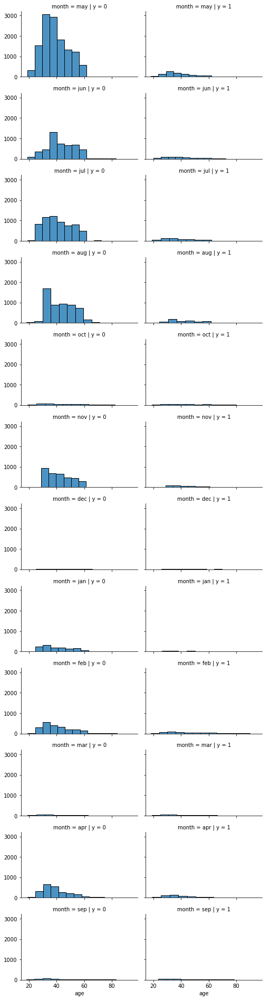

In [640]:
gde = sns.FacetGrid(data=data_full_cleaned, col='y',row='month',size=2.2, aspect=1.6)
gde.map(sns.histplot, 'age', alpha=.8, bins=12)
gde.add_legend()

Moreover, we are going to visualise and gain more insight for numerical columns of the given data set.

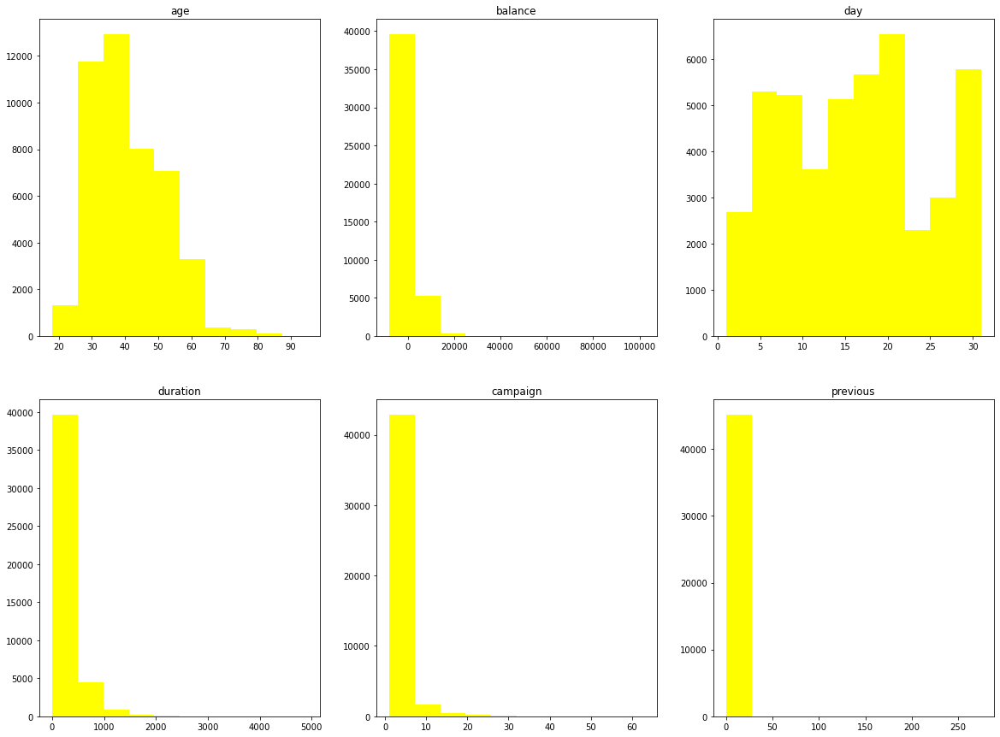

In [641]:
num_columns = ['age', 'balance', 'day','duration', 'campaign', 'previous']

fig, axs = plt.subplots(2, 3, sharex=False, sharey=False, figsize=(20, 15))

counter = 0
for num_column in num_columns:
    
    trace_x = counter // 3
    trace_y = counter % 3
    
    axs[trace_x, trace_y].hist(data_full_cleaned[num_column], color = 'yellow')
    
    axs[trace_x, trace_y].set_title(num_column)
    
    counter += 1

plt.show()

Now we are going to assess each given numerical feature as follows:

***
# Age  feature

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



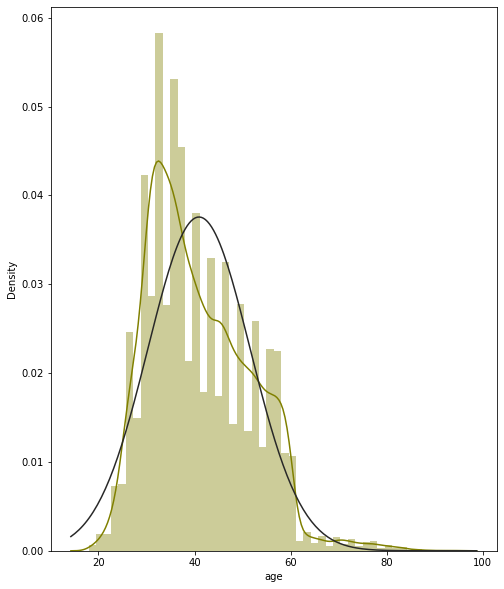

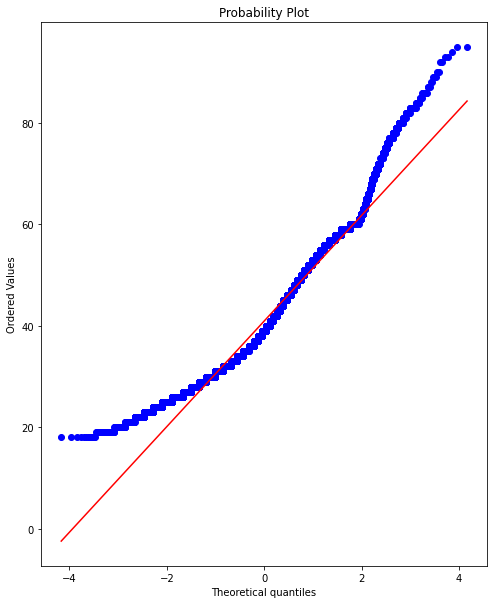

In [642]:
sns.distplot(data_full_cleaned['age'],fit=stats.norm, color = 'olive')
vis = plt.figure()
res = stats.probplot(data_full_cleaned['age'], plot=plt)

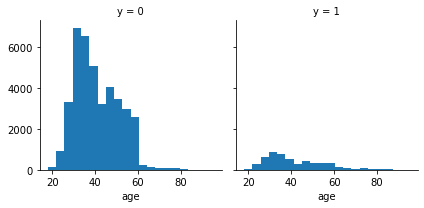

In [643]:
g = sns.FacetGrid(data_full_cleaned, col='y')
g.map(plt.hist, 'age', bins=20)

***
# Balance  feature

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:316: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



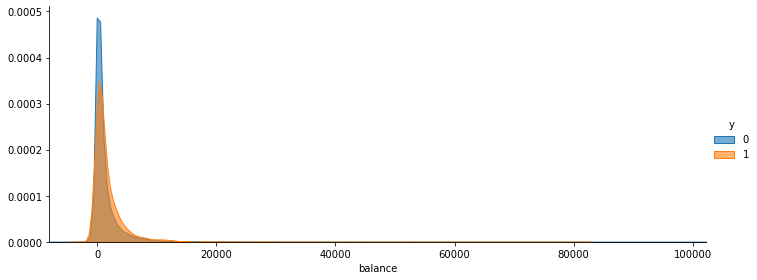

In [644]:
griddata = sns.FacetGrid(data_full_cleaned, hue='y', size=4,aspect=2.5)
griddata.map(sns.kdeplot, 'balance', shade=True, alpha=.6)
griddata.set(xlim=(data_full_cleaned['balance'].min(),data_full_cleaned['balance'].max()))
griddata.add_legend()

In [645]:
data_full_cleaned.corr().balance.y # current correlation

0.05283841028818198

By making into 4 ranges of 'balance' column, we can improve correlation between 'balance' and 'y'

In [646]:
data_full_cleaned['Balance_band'] = pd.cut(data_full_cleaned['balance'],4)
data_full_cleaned[['Balance_band', 'y']].groupby('Balance_band', as_index=True).mean().sort_values(by='Balance_band', ascending=False)

,y
Balance_band,
"(74590.5, 102127.0]",0.500000
"(47054.0, 74590.5]",0.142857
"(19517.5, 47054.0]",0.136612
"(-8129.146, 19517.5]",0.116863


In [647]:
# By making into 3 categories we find the following 
for bal_col in[data_full_cleaned]:
    bal_col.loc[ bal_col['balance'] <= 0, 'balance'] = 0
    bal_col.loc[ (bal_col['balance'] > 0) & (bal_col['balance'] <= 74590.5), 'balance'] = 1
    bal_col.loc[ (bal_col['balance'] > 74590.5), 'balance'] = 2

In [648]:
data_full_cleaned.corr().balance.y # new correlation after modification

0.06572521058089613

In [649]:
data_full_cleaned['balance'].describe()

count    45211.000000
mean         0.839066
std          0.367715
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: balance, dtype: float64

# Duration feature

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



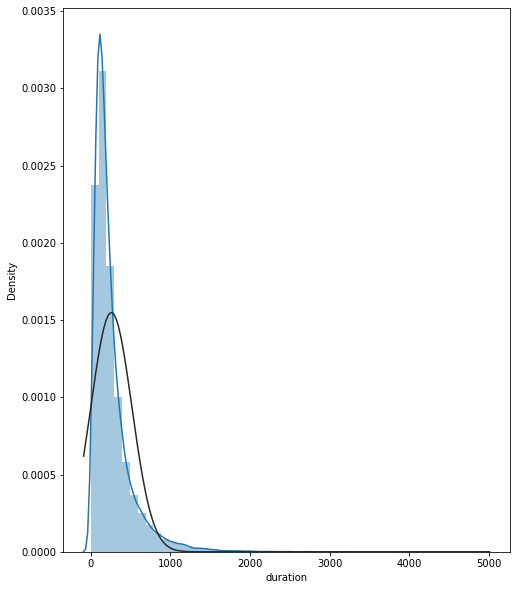

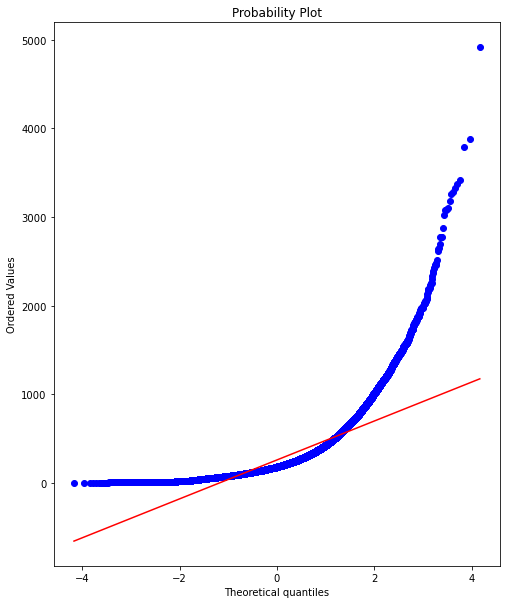

In [650]:
sns.distplot(data_full_cleaned['duration'],fit=stats.norm)
fig = plt.figure()
res = stats.probplot(data_full_cleaned['duration'], plot=plt)

In [651]:
data_full_cleaned['dband'] = pd.cut(data_full_cleaned['duration'],4)
data_full_cleaned[['dband','y']].groupby('dband', as_index=True).mean().sort_values(by='y', ascending=False)

,y
dband,
"(1229.5, 2459.0]",0.625259
"(2459.0, 3688.5]",0.545455
"(3688.5, 4918.0]",0.333333
"(-4.918, 1229.5]",0.111268


In [652]:
data_full_cleaned = data_full_cleaned.drop('Balance_band', axis=1)

In [653]:
data_full_cleaned

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,previous,poutcome,y,dband
0,58,management,married,tertiary,0,1,1,0,unknown,5,may,261,1,0,unknown,0,"(-4.918, 1229.5]"
1,44,technician,single,secondary,0,1,1,0,unknown,5,may,151,1,0,unknown,0,"(-4.918, 1229.5]"
2,33,entrepreneur,married,secondary,0,1,1,1,unknown,5,may,76,1,0,unknown,0,"(-4.918, 1229.5]"
3,47,blue-collar,married,unknown,0,1,1,0,unknown,5,may,92,1,0,unknown,0,"(-4.918, 1229.5]"
4,33,unknown,single,unknown,0,1,0,0,unknown,5,may,198,1,0,unknown,0,"(-4.918, 1229.5]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,0,1,0,0,cellular,17,nov,977,3,0,unknown,1,"(-4.918, 1229.5]"
45207,71,retired,divorced,primary,0,1,0,0,cellular,17,nov,456,2,0,unknown,1,"(-4.918, 1229.5]"
45208,72,retired,married,secondary,0,1,0,0,cellular,17,nov,1127,5,3,success,1,"(-4.918, 1229.5]"
45209,57,blue-collar,married,secondary,0,1,0,0,telephone,17,nov,508,4,0,unknown,0,"(-4.918, 1229.5]"


# Day Feature 

In [654]:
pd.crosstab(data_full_cleaned['day'],data_full_cleaned['y'], margins=True).sort_values(by=1, ascending=False).style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,All
day,,,
All,39922,5289,45211
30,1295,271,1566
12,1359,244,1603
13,1344,241,1585
15,1465,238,1703
4,1215,230,1445
18,2080,228,2308
5,1695,215,1910
14,1638,210,1848


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:316: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



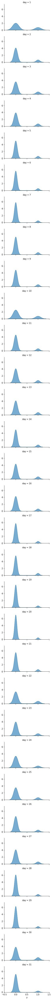

In [655]:
gdday = sns.FacetGrid(data=data_full_cleaned, row='day', size=2.2, aspect=1.6)
gdday.map(sns.kdeplot, 'y',shade=True, alpha=.6)
gdday.add_legend()

# Campaign feature

In [656]:
pd.crosstab(data_full_cleaned['campaign'],data_full_cleaned['y'], margins=True).sort_values(by=1, ascending=False).style.background_gradient(axis=None
                                                                                  , low=0.75, high=1.0)

y,0,1,All
campaign,,,
All,39922,5289,45211
1,14983,2561,17544
2,11104,1401,12505
3,4903,618,5521
4,3205,317,3522
5,1625,139,1764
6,1199,92,1291
7,688,47,735
8,508,32,540


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:316: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-

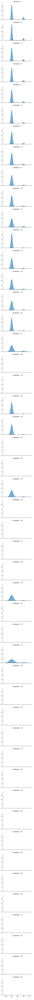

In [657]:
gdcamp = sns.FacetGrid(data=data_full_cleaned, row='campaign', size=2.2, aspect=1.6)
gdcamp.map(sns.kdeplot, 'y',shade=True, alpha=.6)
gdcamp.add_legend()

In [658]:
data_full_cleaned['camp_split'] = pd.cut(data_full_cleaned['campaign'],2)

In [659]:
data_full_cleaned[['camp_split','y']].groupby('camp_split', as_index=True).mean().sort_values(by='y', ascending=False)

,y
camp_split,
"(0.938, 32.0]",0.117083
"(32.0, 63.0]",0.000000


In [660]:
data_full_cleaned.drop('camp_split', axis=1, inplace=True)

We are going to perform the correlation matrix to verify if there is a correlation between numerical variables and target variable 'y'. Consider the following

In [661]:
corrs = data_full_cleaned.corr()
figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    showscale=True)
figure

From the corellation matrix above we see that the duration column has the highest correlation with term deposit 'y' in the whole correlation matrix with 0.39

We will perform the same with the dummy variables where they were defined before. Consider the following:

In [662]:
corrs_with_dummies = data_full_cleaned_with_dummies.corr()
figure_with_dummies = ff.create_annotated_heatmap(
    z=corrs_with_dummies.values,
    x=list(corrs_with_dummies.columns),
    y=list(corrs_with_dummies.index),
    annotation_text=corrs_with_dummies.round(2).values,
    showscale=True)
figure_with_dummies

Since we have a large correlation matrix we will define a function which returns highest correlation values of this data set with dummie variables. We have the following:

In [663]:
def corrFilter(x: pd.DataFrame, bound: float):
    xCorr = data_full_cleaned_with_dummies.corr()
    xFiltered = xCorr[(xCorr >= bound) & (xCorr !=1)]
    xFlattened = xFiltered.unstack().sort_values().drop_duplicates()
    return xFlattened

corrFilter(data_full_cleaned_with_dummies, .4).dropna()

contact_unknown  month_may             0.425700
housing          month_may             0.427980
age              job_retired           0.447378
contact_unknown  month_jun             0.453077
job_management   education_tertiary    0.598900
dtype: float64

These correlations from the correlation matrix are the most positive correlations in this data set. In the following lines we are chekcing the amount of the positive and negative entries in the correlation matrix.

In [664]:
neg_cor = corrs_with_dummies[corrs_with_dummies <0]
neg_cor.count().sum() # for negative correlations

1026

In [665]:
pos_cor = corrs_with_dummies[corrs_with_dummies >0]
pos_cor.count().sum() # for positive correlations

738

# 3 Section - Data Modelling

In [666]:
# Independnet features
X_ind = data_full_cleaned_with_dummies.drop(['y'], axis=1)
# Dependent feature
y_d = data_full_cleaned_with_dummies['y']
X_ind.head()

,age,default,balance,housing,loan,day,duration,campaign,previous,job_blue-collar,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,0,0,...,0,0,0,1,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,0,0,...,0,0,0,1,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,0,0,...,0,0,0,1,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,0,1,...,0,0,0,1,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,0,0,...,0,0,0,1,0,0,0,0,0,1


In [667]:
X_train,X_test,y_train,y_test= train_test_split(X_ind,y_d,test_size=0.20,random_state=42)

X_train = pd.DataFrame(X_train, columns = X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)

In [668]:
#Logistic regression model
logit= LogisticRegression()
logit.fit(X_train, y_train)
print(logit.fit(X_train, y_train))

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [669]:
# Predicting the model
pred_logit= logit.predict(X_test)

In [670]:
print("The accuracy of logit model is:", accuracy_score(y_test, pred_logit))
print(classification_report(y_test, pred_logit))

The accuracy of logit model is: 0.8888643149397324
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      7952
           1       0.60      0.23      0.34      1091

    accuracy                           0.89      9043
   macro avg       0.75      0.61      0.64      9043
weighted avg       0.87      0.89      0.87      9043



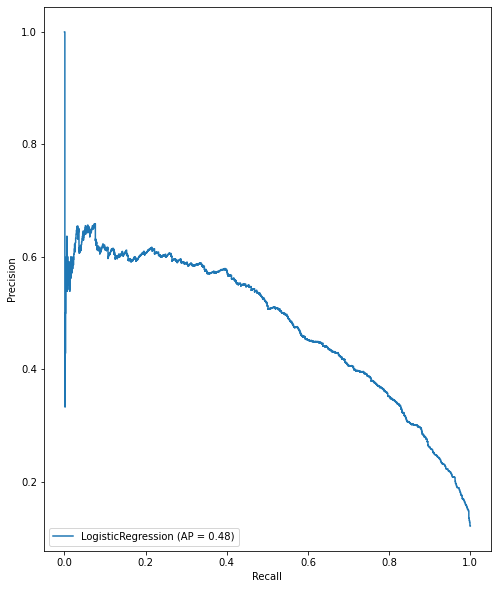

In [671]:
plot_precision_recall_curve(logit,X_test,y_test)

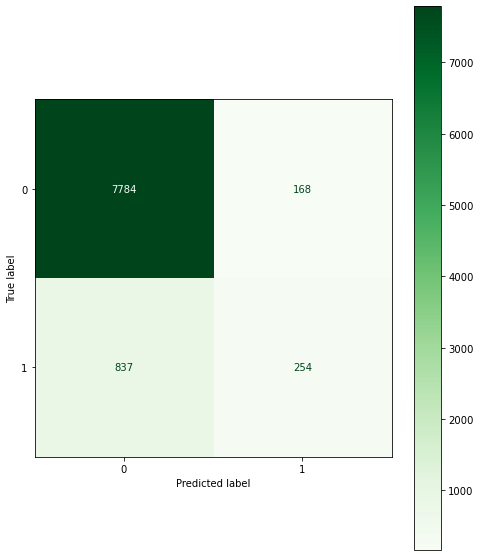

In [672]:
plot_confusion_matrix(logit, X_test, y_test, cmap="Greens")

In [673]:
logit.predict_proba(X_test)

array([[0.98949378, 0.01050622],
       [0.96433491, 0.03566509],
       [0.88308422, 0.11691578],
       ...,
       [0.98445109, 0.01554891],
       [0.98849174, 0.01150826],
       [0.95425812, 0.04574188]])

We will scale the features in order our model would not lead to bias towards higher range of values(outliers). Consider the following lines of code:

In [674]:
scaler= StandardScaler()
X_sc= scaler.fit_transform(X)

In [675]:
X_sc

array([[ 1.60696496, -0.13548989,  0.25641925, ..., -0.20597248,
        -0.185948  ,  0.47251925],
       [ 0.28852927, -0.13548989, -0.43789469, ..., -0.20597248,
        -0.185948  ,  0.47251925],
       [-0.74738448, -0.13548989, -0.44676247, ..., -0.20597248,
        -0.185948  ,  0.47251925],
       ...,
       [ 2.92540065, -0.13548989,  1.42959305, ..., -0.20597248,
         5.37784754, -2.11631591],
       [ 1.51279098, -0.13548989, -0.22802402, ..., -0.20597248,
        -0.185948  ,  0.47251925],
       [-0.37068857, -0.13548989,  0.52836436, ...,  4.85501757,
        -0.185948  , -2.11631591]])

In [676]:
X_train_sc,X_test_sc,y_train_sc,y_test_sc= train_test_split(X_sc,y_d,test_size=0.20,random_state=42)

In [677]:
logit_sc= LogisticRegression()
logit_sc.fit(X_train_sc, y_train_sc)
print(logit.fit(X_train_sc, y_train_sc))

LogisticRegression()


In [678]:
# Predicting the model
pred_logit_sc= logit.predict(X_test_sc)

In [679]:
print("The accuracy of logit model is:", accuracy_score(y_test_sc, pred_logit_sc))
print(classification_report(y_test_sc, pred_logit_sc))

The accuracy of logit model is: 0.8987061815769103
              precision    recall  f1-score   support

           0       0.92      0.98      0.94      7952
           1       0.65      0.34      0.45      1091

    accuracy                           0.90      9043
   macro avg       0.78      0.66      0.70      9043
weighted avg       0.88      0.90      0.88      9043



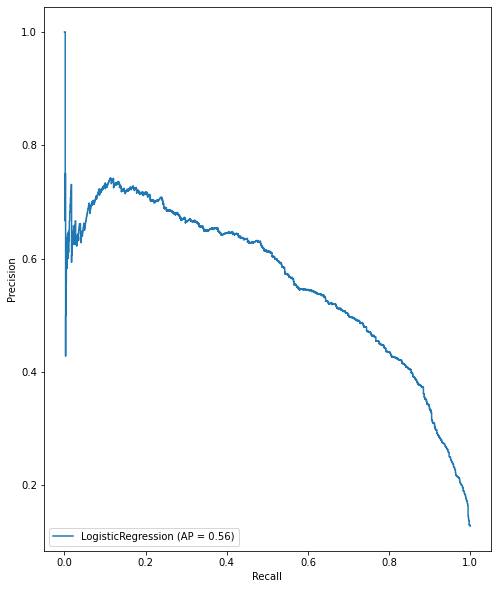

In [680]:
plot_precision_recall_curve(logit_sc,X_test_sc,y_test_sc)

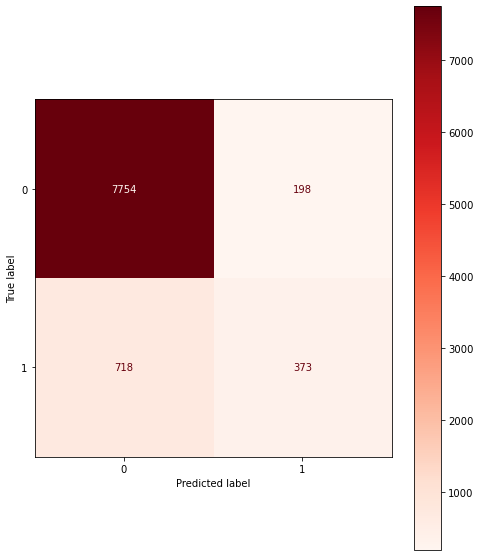

In [681]:
plot_confusion_matrix(logit_sc, X_test_sc, y_test_sc, cmap="Reds")

In [682]:
logit_sc.predict_proba(X_test_sc)

array([[0.99189902, 0.00810098],
       [0.96820682, 0.03179318],
       [0.80954621, 0.19045379],
       ...,
       [0.98431518, 0.01568482],
       [0.99257672, 0.00742328],
       [0.96350251, 0.03649749]])

There is another way of performing Logistic regression model as follows:

In [683]:
# Train the logistic regression model on the training data
logistic_reg = LogisticRegression(solver='lbfgs').fit(X_train, np.ravel(y_train))

# Create predictions of probability for loan status using test data
preds = logistic_reg.predict_proba(X_test)

# Create dataframes of first five predictions, and first five true labels
preds_df = pd.DataFrame(preds[:,1][0:5], columns = ['prob_deposit'])
true_df = y_test.head()

# Concatenate and print the two data frames for comparison
print(pd.concat([true_df.reset_index(drop = True), preds_df], axis = 1))

   y  prob_deposit
0  0      0.010506
1  0      0.035665
2  0      0.116916
3  0      0.419000
4  0      0.065077


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [684]:
# Create predictions and store them in a variable
preds = logistic_reg.predict_proba(X_test)

# Print the accuracy score the model
print(logistic_reg.score(X_test, y_test))

0.8888643149397324


We are going to visualise receiver operating characteristic curve (ROC curve) of the probabilities of the term deposit subscription. Consider the following

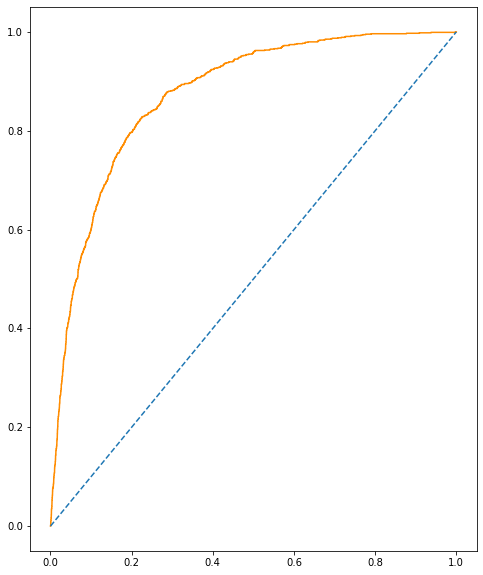

In [685]:
prob_term_deposit = preds[:, 1]
fallout, sensitivity, thresholds = metrics.roc_curve(y_test, prob_term_deposit)
plt.plot(fallout, sensitivity, color = 'darkorange')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.show()

In [686]:
auc = roc_auc_score(y_test, prob_term_deposit)
auc

0.8731174858500222

In [687]:
#Finding the accuracy using cross validation method
score_log_reg = cross_val_score(logit, X, y, scoring='accuracy', cv=10)
print(score_log_reg)
print(score_log_reg.mean())

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/m.n

[0.90159222 0.90378235 0.9093121  0.87790312 0.89073214 0.88453882
 0.86374696 0.86640124 0.89272285 0.8495908 ]
0.8840322585221007


/Users/m.nicajus/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



This gives smaller accuracy of the model usinig cross validation method rather than using classification report analysis

We will see another way to see the correlation using logistic regression model, this time we use scaled features in order to have more precise score.

# Extra part: Assesing other models for predicting target variable

We will use other models just to see how they differ from logistic model just for curiosity. Firstly, we are going to assess the XGBoost classifier model. Consider the following:

In [688]:
xgb = xgboost.XGBClassifier(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75,
                           colsample_bytree=1, max_depth=7)
xgb.fit(X_train,y_train.squeeze().values)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.08, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.75,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [689]:
y_train_preds = xgb.predict(X_train)
y_test_preds = xgb.predict(X_test)

print('XGB accuracy score for train: %.3f: test: %.3f' % (
        accuracy_score(y_train, y_train_preds),
        accuracy_score(y_test, y_test_preds)))

XGB accuracy score for train: 0.936: test: 0.906


Furthermore, we are going to assess the importance of the features in this data set using XGBoost model. We have the following:

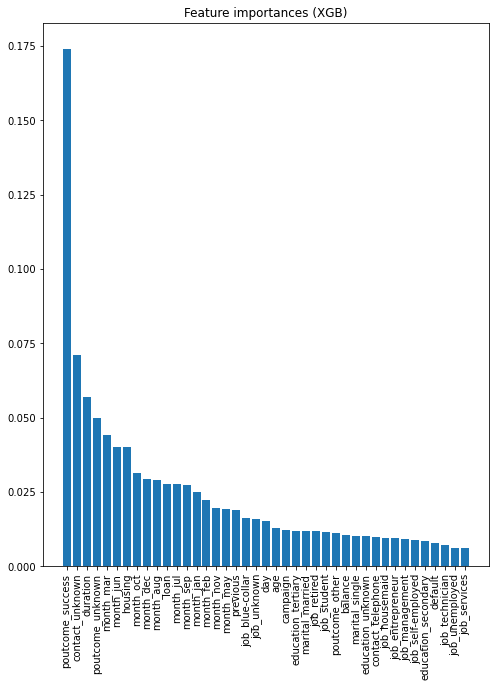

In [690]:
head = ["name", "score"]
values = sorted(zip(X_train.columns, xgb.feature_importances_), key=lambda x: x[1] * -1)
xgb_feature_importances = pd.DataFrame(values, columns = head)

#plot feature importances
x_pos = np.arange(0, len(xgb_feature_importances))
plt.bar(x_pos, xgb_feature_importances['score'])
plt.xticks(x_pos, xgb_feature_importances['name'])
plt.xticks(rotation=90)
plt.title('Feature importances (XGB)')

plt.show()

From the graph above we can see that by showing the importance feature including dummy variables, most important features are :

* The last contact duration of the client 
* The successful outcome of the previous marketing campaign
* The unknown type of communication for promoting a campaign(Probably was live meeting or proposing the campaign in person)

Another model which we will assess will be Support vector machine(SVM). Consider the following analysis:

In [691]:
svc = svm.SVC(kernel='rbf', C=70, gamma=0.001).fit(X_train_sc,y_train_sc)
prediction_svm = svc.predict(X_test_sc)
print(classification_report(y_test_sc,predictionsvm))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      7952
           1       0.69      0.31      0.43      1091

    accuracy                           0.90      9043
   macro avg       0.80      0.65      0.69      9043
weighted avg       0.88      0.90      0.88      9043



In [692]:
percentage = svc.score(X_test_sc,y_test_sc)
percentage    

0.8997014265177485

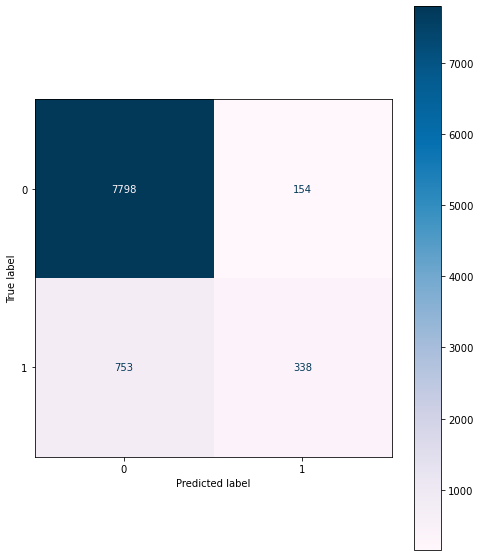

In [693]:
plot_confusion_matrix(svc, X_test_sc, y_test_sc, cmap="PuBu")